# Necessary Imports

In [2]:
import os
import cv2
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [3]:
import os
import cv2
import json
import glob
# import torch
import shutil
import random
import requests
import numpy as np
import pandas as pd
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
from src.create_annotations import *
import matplotlib.patches as patches
from shapely.geometry import Polygon, MultiPolygon

In [4]:
import os
import cv2 as cv
import json
import shutil
import random
import numpy as np
import glob
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from src.create_annotations import *
from shapely.geometry import Polygon, MultiPolygon
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from skimage import morphology
from skimage.filters import threshold_otsu
from skimage.transform import rotate
from skimage import exposure
from skimage.filters import unsharp_mask
from skimage.restoration import denoise_tv_chambolle
from skimage.transform import resize


In [5]:
import os
import cv2
import json
import glob
import torch
import shutil
import random
import requests
import numpy as np
import pandas as pd
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
from src.create_annotations import *
import matplotlib.patches as patches
from shapely.geometry import Polygon, MultiPolygon

In [35]:
import os
import cv2 as cv
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import json
import shutil
import random
import requests
from PIL import Image
from pathlib import Path
import matplotlib.patches as patches
from shapely.geometry import Polygon, MultiPolygon
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from src.create_annotations import *
from skimage import morphology
from skimage.filters import threshold_otsu
from skimage.transform import rotate
from skimage import exposure
from skimage.filters import unsharp_mask
from skimage.restoration import denoise_tv_chambolle
from skimage.transform import resize


# Data Input

In [2]:
# Dataset path
dataset_path = "Dataset/"

# Paths for images and masks
images_path = os.path.join(dataset_path, "Input/Images")
masks_path = os.path.join(dataset_path, "Input/Bmasks")

# Get list of files
images_files = os.listdir(images_path)
masks_files = os.listdir(masks_path)

# Create dataframes
images_df = pd.DataFrame({"image": images_files})
masks_df = pd.DataFrame({"mask": masks_files})

# Print sizes and heads
print("Images size:", len(images_df))
print("Masks size:", len(masks_df))

print("\nImages head:")
print(images_df.head(10))

print("\nMasks head:")
print(masks_df.head(10))


Images size: 50
Masks size: 50

Images head:
              image
0  ISIC_0024306.jpg
1  ISIC_0024307.jpg
2  ISIC_0024308.jpg
3  ISIC_0024309.jpg
4  ISIC_0024310.jpg
5  ISIC_0024311.jpg
6  ISIC_0024312.jpg
7  ISIC_0024313.jpg
8  ISIC_0024314.jpg
9  ISIC_0024315.jpg

Masks head:
                            mask
0  ISIC_0024306_segmentation.png
1  ISIC_0024307_segmentation.png
2  ISIC_0024308_segmentation.png
3  ISIC_0024309_segmentation.png
4  ISIC_0024310_segmentation.png
5  ISIC_0024311_segmentation.png
6  ISIC_0024312_segmentation.png
7  ISIC_0024313_segmentation.png
8  ISIC_0024314_segmentation.png
9  ISIC_0024315_segmentation.png


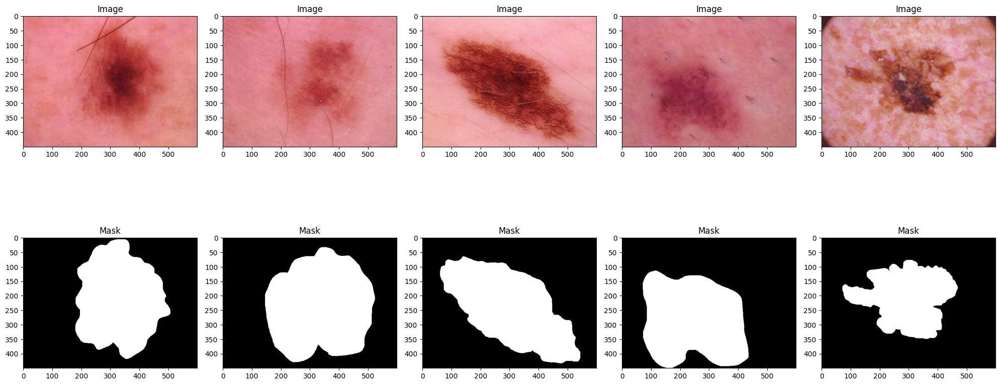

In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Display 5 images and their masks
fig, axs = plt.subplots(2, 5, figsize=(20, 10))

for i in range(5):
    # Load image
    image_name = images_df.iloc[i]["image"]
    image_path = os.path.join(images_path, image_name)
    image = mpimg.imread(image_path)

    # Load mask
    mask_name = image_name.replace(".jpg", "_segmentation.png")
    mask_path = os.path.join(masks_path, mask_name)
    mask = mpimg.imread(mask_path)

    # Display image and mask
    axs[0, i].imshow(image)
    axs[0, i].axis('on')
    axs[0, i].set_title("Image")

    axs[1, i].imshow(mask, cmap='gray')
    axs[1, i].axis('on')
    axs[1, i].set_title("Mask")

plt.tight_layout()
plt.show()


# Resizing

In [4]:
# Resize images and masks to 416x416
new_size = (416, 416)

resized_images = []
resized_masks = []
image_filenames = []
mask_filenames = []

for i in range(len(images_df)):
    # Load image
    image_name = images_df.iloc[i]["image"]
    image_path = os.path.join(images_path, image_name)
    image = cv2.imread(image_path)

    # Load mask
    mask_name = image_name.replace(".jpg", "_segmentation.png")
    mask_path = os.path.join(masks_path, mask_name)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # Resize image
    resized_image = cv2.resize(image, new_size, interpolation=cv2.INTER_LINEAR)

    # Resize mask
    resized_mask = cv2.resize(mask, new_size, interpolation=cv2.INTER_NEAREST)

    # Store resized images and masks
    resized_images.append(resized_image)
    resized_masks.append(resized_mask)

    # Store original filenames
    image_filenames.append(image_name)
    mask_filenames.append(mask_name)

# Convert resized images and masks to numpy arrays
resized_images = np.array(resized_images)
resized_masks = np.array(resized_masks)

print("Resized images shape:", resized_images.shape)
print("Resized masks shape:", resized_masks.shape)


Resized images shape: (50, 416, 416, 3)
Resized masks shape: (50, 416, 416)


In [5]:
image_dir = "Dataset/Input/ResizedImg/resize_image/"
mask_dir = "Dataset/Input/ResizedImg/resize_image_mask/"
# Save resized images
for i in range(len(resized_images)):
    image_filename = image_filenames[i]
    mask_filename = mask_filenames[i]
    
    # Save resized image
    resized_image = Image.fromarray(resized_images[i])
    resized_image.save(os.path.join(image_dir, image_filename))

    # Save resized mask
    resized_mask = Image.fromarray(resized_masks[i])
    resized_mask.save(os.path.join(mask_dir, mask_filename))


In [6]:
def swap_rgb(image):
    return image[:, :, ::-1]

In [7]:
def RGBimshow(img):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img)

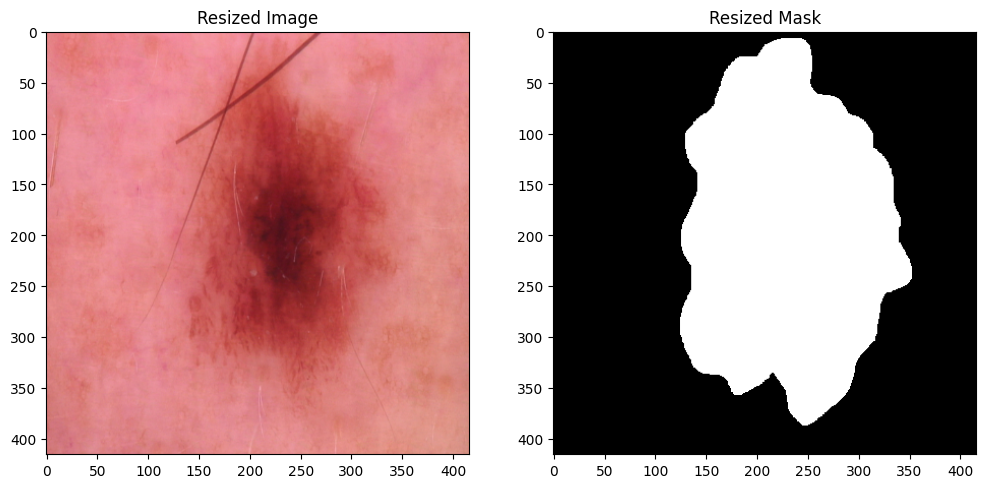

In [8]:
# Choose an index for the image
index = 0

# Plot the resized image and its mask
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Plot resized image
axs[0].imshow(swap_rgb(resized_images[index]))
axs[0].axis('on')
axs[0].set_title('Resized Image')

# Plot resized mask
axs[1].imshow(resized_masks[index], cmap='gray')
axs[1].axis('on')
axs[1].set_title('Resized Mask')

plt.show()

In [9]:
# Get the new width and height
new_height, new_width = resized_images[index].shape[:2]

# Print the new size
print(f"Resized Image Size - Width: {new_width}, Height: {new_height}")


Resized Image Size - Width: 416, Height: 416


# Coco Json Creation

In [10]:
# Label ids of the dataset
category_ids = {
    "non": 0,
    "affected": 1,
}

# Define which colors match which categories in the images
category_colors = {
    "(0, 0, 0)": 0, # normal
    "(255, 255, 255)": 1, # affected
}

# Define the ids that are a multipolygon.
multipolygon_ids = [1]

In [14]:
# Get "images" and "annotations" info
def images_annotations_info(maskpath):
    # This id will be automatically increased as we go
    annotation_id = 0
    image_id = 0
    annotations = []
    images = []
    
    for mask_image in glob.glob(maskpath + "*.png"):
        # The mask image is *.png but the original image is *.jpg.

        original_file_name = os.path.basename(mask_image).split("_segmentation.")[0] + ".jpg"

        # Open the image and (to be sure) we convert it to RGB
        mask_image_open = Image.open(mask_image).convert("RGB")
        w, h = mask_image_open.size
        
        # "images" info 
        image = create_image_annotation(original_file_name, w, h, image_id)
        images.append(image)

        sub_masks = create_sub_masks(mask_image_open, w, h)
        has_class_1 = False
        for color, sub_mask in sub_masks.items():
            category_id = category_colors[color]

            # "annotations" info
            polygons, segmentations = create_sub_mask_annotation(sub_mask)

            # Check if we have classes that are a multipolygon
            if category_id in multipolygon_ids:
                # Combine the polygons to calculate the bounding box and area
                multi_poly = MultiPolygon(polygons)
                                
                annotation = create_annotation_format(multi_poly, segmentations, image_id, category_id, annotation_id)

                annotations.append(annotation)
                annotation_id += 1
            else:
                for i in range(len(polygons)):
                    # Cleaner to recalculate this variable
                    segmentation = [np.array(polygons[i].exterior.coords).ravel().tolist()]
                    
                    annotation = create_annotation_format(polygons[i], segmentation, image_id, category_id, annotation_id)
                    
                    annotations.append(annotation)
                    annotation_id += 1
                    if category_id == 1:
                        has_class_1 = True
        if not has_class_1:
            # Add a background annotation for the entire image
            annotation = create_annotation_format(Polygon([(0, 0), (w, 0), (w, h), (0, h)]), [[0, 0, w, 0, w, h, 0, h]], image_id, 0, annotation_id)
            annotations.append(annotation)
            annotation_id += 1

        image_id += 1
    return images, annotations, annotation_id



In [15]:
if __name__ == "__main__":
    # Get the standard COCO JSON format
    coco_format = get_coco_json_format()
    
    for keyword in ["resize_image"]:
        mask_path = "Dataset/Input/ResizedImg/{}_mask/".format(keyword)
        
        # Create category section
        coco_format["categories"] = create_category_annotation(category_ids)
    
        # Create images and annotations sections
        coco_format["images"], coco_format["annotations"], annotation_cnt = images_annotations_info(mask_path)

        output_dir = "Dataset/Output/CocoJsonMask"
        os.makedirs(output_dir, exist_ok=True)  # Create the output directory if it doesn't exist

        with open(os.path.join(output_dir, "{}.json".format(keyword)), "w") as outfile:
            json.dump(coco_format, outfile)

        print("Created %d annotations for images in folder: %s" % (annotation_cnt, mask_path))


Created 196 annotations for images in folder: Dataset/Input/ResizedImg/resize_image_mask/


# Plotting the Resized images with coco json masking 

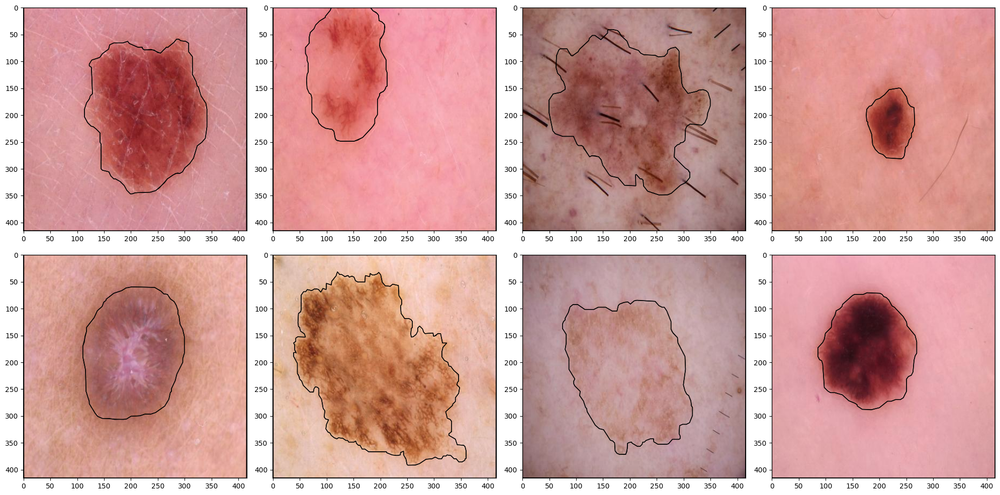

In [16]:
def display_images_with_coco_annotations(image_paths, annotations, display_type='both', colors=None):
    # Create a 2x4 grid of subplots for displaying images
    fig, axs = plt.subplots(2, 4, figsize=(20, 10))
    
    for ax_row, row_images in zip(axs, image_paths):
        for ax, img_path in zip(ax_row, row_images):
            # Load and convert the image to RGB
            image = cv2.imread(img_path)
            
            ax.imshow(image)
            ax.axis('on')

            # Find the image ID for the current image path
            img_filename = os.path.basename(img_path)
            img_id = next(item['id'] for item in annotations['images'] if item["file_name"] == img_filename)
            
            # Get the annotations for the current image ID
            img_annotations = [ann for ann in annotations['annotations'] if ann['image_id'] == img_id]
            
            # Iterate over each annotation and display bounding boxes or segmentations
            for ann in img_annotations:
                if display_type in ['bbox', 'both']:
                    bbox = ann['bbox']
                    ax.add_patch(patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='black', facecolor='none'))
                
                if display_type in ['seg', 'both']:
                    for seg in ann['segmentation']:
                        poly = [(seg[i], seg[i+1]) for i in range(0, len(seg), 2)]
                        ax.add_patch(patches.Polygon(poly, closed=True, edgecolor='black', fill=False))
                        
    plt.tight_layout()
    plt.show()

# Load annotations from the JSON file
with open('Dataset/Output/CocoJsonMask/resize_image.json', 'r') as f:
    annotations = json.load(f)

# Select 8 random image files
image_dir = "Dataset/Input/ResizedImg/resize_image"
image_files = random.sample([os.path.join(image_dir, img['file_name']) for img in annotations['images']], 8)

# Reshape the list of image files into a 2x4 grid
image_files = [image_files[i:i+4] for i in range(0, len(image_files), 4)]

# Display images with COCO annotations
display_images_with_coco_annotations(image_files, annotations, 'seg')


# Pre Processing


In [17]:
# Create the output directory if it doesn't exist
output_dir = 'Dataset/Output/Processed/hairRemoved'
output_dir2 = 'Dataset/Output/Processed/finalProcessed'
os.makedirs(output_dir, exist_ok=True)
os.makedirs(output_dir2, exist_ok=True)

In [18]:
image_list = []
for filename in glob.glob('Dataset/Input/ResizedImg/resize_image/*.jpg') + glob.glob('Dataset/Input/ResizedImg/resize_image/*.png'):  # Assuming images are in JPG format
    im = Image.open(filename)
    image_list.append(im)
len(image_list) 

50

In [19]:
def image_color(image):
    image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    return image_rgb

In [20]:
import cv2

def deskew(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Otsu's thresholding
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Find contours
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the largest contour
    contour = max(contours, key=cv2.contourArea)

    # Get the minimum bounding rectangle of the contour
    rect = cv2.minAreaRect(contour)
    angle = rect[2]

    # Rotate the image to correct skew
    if angle < -45:
        angle += 90
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    
    # Convert the rotated image back to RGB
    # rotated_rgb = cv2.cvtColor(rotated, cv2.COLOR_BGR2RGB)
    
    return image_color(rotated)



In [21]:
def scale_image(image, size=(416, 416)):
    return cv2.resize(image, size)

In [22]:
def remove_noise(image):
    return cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)

In [23]:
def thin_skeletonize(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, binary_image = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY_INV)
    skeletonized_image = morphology.skeletonize(binary_image / 255)
    return cv2.cvtColor(skeletonized_image.astype(np.uint8) * 255, cv2.COLOR_GRAY2BGR)


In [24]:
def binarize_image(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    threshold_value = threshold_otsu(gray_image)
    return gray_image > threshold_value


In [25]:
import cv2
import numpy as np

def sharpen_image(image):
    # Create a sharpening kernel
    kernel = np.array([[-1, -1, -1],
                        [-1,  9, -1],
                        [-1, -1, -1]])

    # Apply the kernel to the image
    sharpened = cv2.filter2D(image, -1, kernel)

    return image_color(sharpened)


In [26]:
def enhance_contrast(image):
    p2, p98 = np.percentile(image, (2, 98))
    return image_color(exposure.rescale_intensity(image, in_range=(p2, p98)))

In [27]:
def super_resolution(image):
    # Use linear interpolation to upscale the image
    upscaled_image = cv.resize(image, (image.shape[0]*4, image.shape[1]*2), interpolation=cv.INTER_LINEAR)
    return upscaled_image

In [28]:
import cv2

def smooth_image(image, sigma=4.5):
    """
    Apply Gaussian blur to the image to make it smoother.

    Args:
    - image: Input image (numpy array).
    - sigma: Standard deviation of the Gaussian kernel.

    Returns:
    - Smoothed image (numpy array).
    """
    return image_color(cv2.GaussianBlur(image, (0, 0), sigma))


In [29]:
def denoise_image(image):
    return denoise_tv_chambolle(image, weight=5)  # Adjust weight as needed


In [30]:
def color_correction(image):
    # Convert the image to LAB color space
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    
    # Split the LAB image into L, A, and B channels
    l, a, b = cv2.split(lab)
    
    # Apply CLAHE (Contrast Limited Adaptive Histogram Equalization) to the L channel
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    
    # Merge the CLAHE-enhanced L channel with the original A and B channels
    merged = cv2.merge((cl, a, b))
    
    # Convert the merged LAB image back to BGR color space
    corrected = cv2.cvtColor(merged, cv2.COLOR_LAB2BGR)
    
    return image_color(corrected)
    

In [31]:
def fill_line(x, y, step=1):
    points = []
    if x[0] == x[1]:
        ys = np.arange(y.min(), y.max(), step)
        xs = np.repeat(x[0], ys.size)
    else:
        m = (y[1] - y[0]) / (x[1] - x[0])
        xs = np.arange(x[0], x[1], step * np.sign(x[1] - x[0]))
        ys = y[0] + m * (xs - x[0])
    return xs.astype(int), ys.astype(int)


In [32]:
def fill_image(img_masked, i_inds, j_inds, interp_win=10):
    for i, j in zip(i_inds, j_inds):
        if (i >= interp_win) or (j >= interp_win):
            template = img_masked[i: i + 2 * interp_win, j: j + 2 * interp_win].flatten()
        elif (img_masked.shape[0] - i < interp_win) or (img_masked.shape[1] - j < interp_win):
            template = img_masked[i - 2 * interp_win: i, j - 2 * interp_win: j].flatten()
        else:
            template = img_masked[i - interp_win: i + interp_win, j - interp_win: j + interp_win].flatten()

        template = np.delete(template, (template < 0))
        img_masked[i, j] = np.median(template)
    return img_masked

In [36]:
def remove_hair(images, cfg=None):
    num_images = len(images)
    if cfg is None:
        class CFG():
            def __init__(self):
                self.edge_low_threshold = 100 # edge high threshold in Canny algorithm
                self.edge_high_threshold = 220 # edge high threshold in Canny algorithm

                self.dark_spot_threshold = 150 # pixels brighter than this are ignored

                self.linelength_threshold = 10 # lines shorter than this are ignored

                self.divergence_threshold = 0.25 # Should be farther away from image center than this threshold to be considered hair
                self.patchiness_threshold = 0.15 # Should be more widespread than this threshold to be considered hair

                self.interp_win = 20
        cfg = CFG()
        

    fig, ax = plt.subplots(num_images, 6, figsize=(12, 2 * num_images))
    plt.subplots_adjust(wspace=0.01, hspace=0.2)
    for this_ax in ax.ravel():
        this_ax.set_axis_off()
    
    img_filtered_all = []
    for image_ind, img_orig in enumerate(images):
        image_size = img_orig.shape[:2]

        # -------------------------------------------------------- Check if input is RGB
        plt.sca(ax[image_ind, 0])
        
        if img_orig.ndim == 3:
            RGB_input = 1
            img = img_orig.mean(-1)
        else:
            RGB_input = 0
            img = img_orig.copy()
        img_rgb = cv.cvtColor(img_orig, cv.COLOR_BGR2RGB)     
        plt.imshow(img_rgb, cmap='gray')
        plt.title('Original')
        
        skip_flag = 0
    
        # -------------------------------------------------------- The Edges
        plt.sca(ax[image_ind, 1])

        kernel = np.ones((3,3),np.uint8)
        img_filt = cv.morphologyEx(np.uint8(img), cv.MORPH_BLACKHAT, kernel) 
        img_filt = np.where(img_filt > 15, img_filt, 0)
        
        kernel = np.ones((4,4),np.uint8)
        img_filt = cv.morphologyEx(img_filt, cv.MORPH_DILATE, kernel)
        
        plt.imshow(img_filt, cmap='gray')
        plt.title('BlachHat')
        
        # -------------------------------------------------------- Edges within dark spots of image
        plt.sca(ax[image_ind, 2])
        
        dark_spots = (img < cfg.dark_spot_threshold).astype(np.uint8)
        kernel = np.ones((4,4),np.uint8)
        dark_spots = cv.morphologyEx(dark_spots, cv.MORPH_DILATE, kernel)
        
        img_filt = img_filt * dark_spots

        plt.imshow(img_filt, cmap='gray')
        plt.title('Only darker pixels')
    
        # -------------------------------------------------------- The Lines detected from the Edges
        plt.sca(ax[image_ind, 3])
        
        lines = cv.HoughLinesP(img_filt, cv.HOUGH_PROBABILISTIC, np.pi / 90, 20, None, 1, 20)

        if lines is not None:
            lines = lines.reshape(-1, 4)
            N_lines = lines.shape[0]

            # exclude short lines
            lines_to_interp = []
            for ind in range(N_lines):
                line = lines[ind, :]
                x, y = fill_line(line[0::2], line[1::2], 1)
                line_length = np.sqrt((line[0] - line[2])**2 + (line[1] - line[3])**2)

                if (line_length < cfg.linelength_threshold):
                    plt.scatter(x, y, 30, alpha=0.1, c='green')
                else:
                    plt.scatter(x, y, 1, alpha=0.5, c='red')
                    lines_to_interp.append( (x, y) )
                
        else:
            skip_flag = 1
            img_filt = np.zeros(image_size)

        plt.imshow(img_filt, cmap='gray')
        plt.title('Long lines')

                
        # -------------------------------------------------------- The Final mask (from only reasonably longer lines)
        plt.sca(ax[image_ind, 4])
        
        if skip_flag == 1:
            Mask = np.zeros(image_size)
            
        else:
            Mask = np.zeros_like(img_filt)
            for (x, y) in lines_to_interp:
                Mask[y, x] = 1

            kernel = np.ones((3,3),np.uint8)
            Mask = cv.morphologyEx(Mask, cv.MORPH_DILATE, kernel)
            Mask = Mask.astype(float)
            Mask_i_inds, Mask_j_inds = np.where(Mask)    

            # -------- Check if it is patchy enough (otherwise it's false positives; because hair is likely patchy)
            i, j = np.where( Mask != 0 )

            if i.size == 0:
                skip_flag = 1
                Mask = np.zeros(image_size)

            else:
                x_patchinees = np.std(j) / Mask.shape[1]
                y_patchinees = np.std(i) / Mask.shape[0]
                x_divergence = np.abs(0.5 - np.mean(i) / Mask.shape[0])
                y_divergence = np.abs(0.5 - np.mean(j) / Mask.shape[1])
                patchiness = np.sqrt( x_patchinees * y_patchinees )
                divergence = np.max([x_divergence, y_divergence])
                
                if (divergence < cfg.divergence_threshold) and (patchiness < cfg.patchiness_threshold):
                    skip_flag = 1
                    Mask = np.zeros(image_size)

        plt.imshow(Mask, cmap='gray')
        plt.title('Final mask')

    
        # -------------------------------------------------------- Interpolate the hairs
        plt.sca(ax[image_ind, 5])
        if skip_flag:
            img_filtered = img_orig
            
        else:
            Mask_temp = 1 - 2 * Mask # Positive if area is good, Negative if area is bad    
            img_filtered = img_orig.copy()
            if RGB_input:
                for channel in range( img_orig.shape[-1] ):
                    img_masked = np.squeeze(img_orig[:,:,channel]) * Mask_temp
                    img_filtered[:, :, channel] = fill_image(img_masked, Mask_i_inds, Mask_j_inds, interp_win=cfg.interp_win)
            else:
                img_masked = img_orig * Mask_temp  
                img_filtered = fill_image(img_masked, Mask_i_inds, Mask_j_inds)
        
        img_rgb = cv.cvtColor(img_filtered, cv.COLOR_BGR2RGB)     
        plt.imshow(img_rgb, cmap='gray')
        plt.title('Filtered')
        img_filtered_all.append(img_filtered)
        
    return img_filtered_all


d:\FinalYearProj_KMRT1S2\myenv\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\FinalYearProj_KMRT1S2\myenv\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\SUVROJIT\AppData\Local\Temp\ipykernel_8436\882763302.py:149: RuntimeWarning: invalid value encountered in cast
  img_filtered[:, :, channel] = fill_image(img_masked, Mask_i_inds, Mask_j_inds, interp_win=cfg.interp_win)


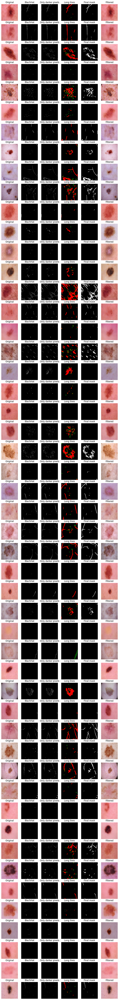

In [37]:
data_path = 'Dataset/Input/ResizedImg/resize_image'
output_path = 'Dataset/Output/Processed/hairRemoved'

# Ensure output directory exists
os.makedirs(output_path, exist_ok=True)

# Assuming `data_path` is the path to your single directory containing all images
images = []
file_names = []
for file_name in os.listdir(data_path):
    file_path = os.path.join(data_path, file_name)
    img = cv.imread(file_path)
    
    # Swap the red and blue channels
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    
    images.append(img)
    file_names.append(file_name)

# Remove hair from images
images_no_hair = remove_hair(images)

# Save processed images
for idx, (img, file_name) in enumerate(zip(images_no_hair, file_names)):
    output_file_path = os.path.join(output_path, file_name)
    cv.imwrite(output_file_path, img)


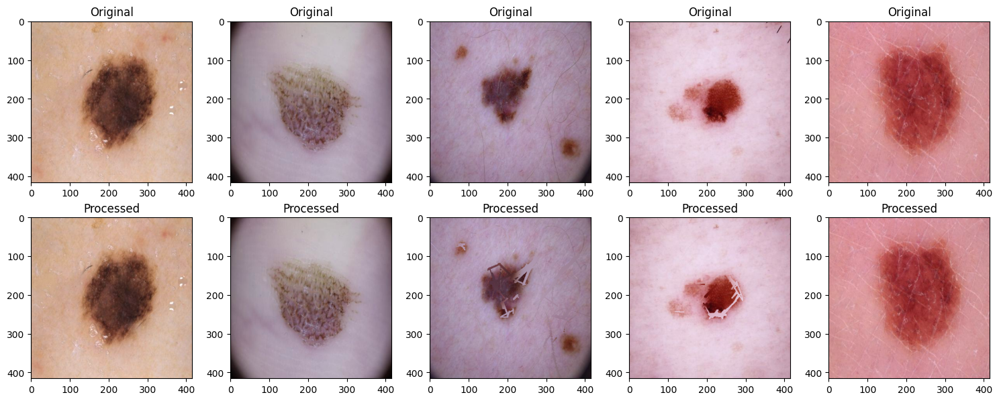

In [38]:
# Display some processed images
plt.figure(figsize=(15, 6))
indices = random.sample(range(len(images)), 5)
for i, index in enumerate(indices):
    plt.subplot(2, 5, i + 1)
    plt.imshow(cv.cvtColor(images[index], cv.COLOR_BGR2RGB))
    plt.axis('on')
    plt.title('Original')
    plt.subplot(2, 5, i + 6)
    plt.imshow(cv.cvtColor(images_no_hair[index], cv.COLOR_BGR2RGB))
    plt.axis('on')
    plt.title('Processed')
plt.tight_layout()
plt.show()


In [39]:
import glob
from PIL import Image
original_image_path = 'Dataset/Output/Processed/hairRemoved/'

image_list2 = []
for filename in glob.glob('Dataset/Output/Processed/hairRemoved/*.jpg') + glob.glob('Dataset/Output/Processed/hairRemoved/*.png'):
    im = Image.open(filename)
    image_list2.append(im)

len(image_list2)


50

In [40]:
def save_processed_image(processed_image, output_dir, filename):
    output_filename = os.path.join(output_dir, os.path.basename(filename))
    cv2.imwrite(output_filename, processed_image.astype(np.uint8))


In [39]:
# def save_images(image_list, output_dir):
#     # Iterate over the image list
#     for idx, im in enumerate(image_list):
#         # Convert PIL image to OpenCV format
#         cv_image = np.array(im)

#         # Skew Correction(please dont use makes the surrounding hazy(suv))
#         # deskewed_image = deskew(cv_image)
#         # save_processed_image(deskewed_image, output_dir, idx)

#         # Image Scaling(use not recomended makes the img small out of our ratio(suv))
#         # scaled_image = scale_image(cv_image)
#         # save_processed_image(scaled_image, output_dir, idx)
       
#         # Noise Removal(dont use takes a lot of time(suv))
#         # noise_removed_image = remove_noise(cv_image)
#         # save_processed_image(noise_removed_image, output_dir, idx)

#         # Thinning and Skeletonization
#         # skeletonized_image = thin_skeletonize(cv_image)
#         # save_processed_image(skeletonized_image, output_dir, idx)

#         color_correction_image = color_correction(cv_image)
#         save_processed_image(color_correction_image, output_dir, idx)
        
#         sharpened_image = sharpen_image(color_correction_image)
#         save_processed_image(sharpened_image, output_dir, idx)

#         enhance_contrast_image = enhance_contrast(sharpened_image)
#         save_processed_image(enhance_contrast_image, output_dir, idx)

#         super_resolution_image = super_resolution(enhance_contrast_image)
#         save_processed_image(super_resolution_image, output_dir, idx)

#         smoother_image = smooth_image(super_resolution_image)
#         save_processed_image(smoother_image, output_dir, idx)

#         #do not use (suv)
#         # denoised_image = denoise_image(cv_image)
#         # save_processed_image(denoised_image, output_dir, idx)

       
        

#     # Notify user that processing is complete
#     print("Image processing complete. Processed images saved in 'output/processed_images' directory.")


In [41]:
def save_images(image_list, output_dir, filenames):
    # Iterate over the image list
    for filename, im in zip(filenames, image_list):
        # Convert PIL image to OpenCV format
        cv_image = np.array(im)

        color_correction_image = color_correction(cv_image)
        save_processed_image(color_correction_image, output_dir, filename)
        
        sharpened_image = sharpen_image(color_correction_image)
        save_processed_image(sharpened_image, output_dir, filename)

        enhance_contrast_image = enhance_contrast(sharpened_image)
        save_processed_image(enhance_contrast_image, output_dir, filename)

        super_resolution_image = super_resolution(enhance_contrast_image)
        save_processed_image(super_resolution_image, output_dir, filename)

        smoother_image = smooth_image(super_resolution_image)
        save_processed_image(smoother_image, output_dir, filename)

    # Notify user that processing is complete
    print("Image processing complete. Processed images saved in 'output/processed_images' directory.")
output_dir = 'Dataset/Output/Processed/finalProcessed'
filenames = [file_name for file_name in os.listdir(data_path)]
save_images(images_no_hair, output_dir, filenames)


Image processing complete. Processed images saved in 'output/processed_images' directory.


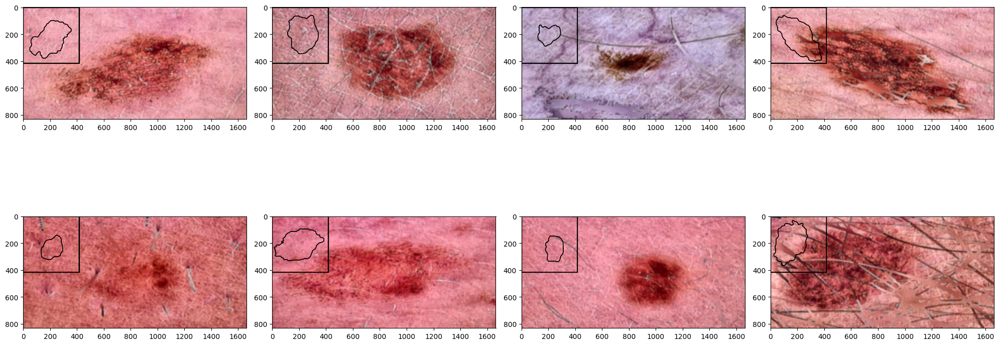

In [42]:
def display_images_with_coco_annotations(image_paths, annotations, display_type='both', colors=None):
    # Create a 2x4 grid of subplots for displaying images
    fig, axs = plt.subplots(2, 4, figsize=(20, 10))
    
    for ax_row, row_images in zip(axs, image_paths):
       
        for ax, img_path in zip(ax_row, row_images):
           
            image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
            ax.imshow(image)
            ax.axis('on')

            # Find the image ID for the current image path
            img_filename = os.path.basename(img_path)
            img_id = next(item['id'] for item in annotations['images'] if item["file_name"] == img_filename)
            
            # Get the annotations for the current image ID
            img_annotations = [ann for ann in annotations['annotations'] if ann['image_id'] == img_id]
            
            # Iterate over each annotation and display bounding boxes or segmentations
            for ann in img_annotations:
                if display_type in ['bbox', 'both']:
                    bbox = ann['bbox']
                    ax.add_patch(patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='black', facecolor='none'))
                
                if display_type in ['seg', 'both']:
                    for seg in ann['segmentation']:
                        poly = [(seg[i], seg[i+1]) for i in range(0, len(seg), 2)]
                        ax.add_patch(patches.Polygon(poly, closed=True, edgecolor='black', fill=False))
                        
    plt.tight_layout()
    plt.show()

# Load annotations from the JSON file
with open('Dataset/Output/CocoJsonMask/resize_image.json', 'r') as f:
    annotations = json.load(f)

# Select 8 random image files
image_dir = "Dataset/Output/Processed/finalProcessed"
image_files = random.sample([os.path.join(image_dir, img['file_name']) for img in annotations['images']], 8)

# Reshape the list of image files into a 2x4 grid
image_files = [image_files[i:i+4] for i in range(0, len(image_files), 4)]

# Display images with COCO annotations
display_images_with_coco_annotations(image_files, annotations, 'seg')


In [43]:
# Path to the directory
dir_path = "Dataset/Output/Processed/finalProcessed"

# List all files in the directory
files = os.listdir(dir_path)

# Find the first image file
image_file = next((file for file in files if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))), None)

# If an image file is found, load it
if image_file:
    image_path = os.path.join(dir_path, image_file)
    image = Image.open(image_path)
    
    # Get the width and height of the image
    if image is not None:
        new_width, new_height = image.size
        print(f"Width: {new_width}, Height: {new_height}")
    else:
        print("Failed to load image.")
else:
    print("No image files found in the directory.")


Width: 1664, Height: 832


In [44]:

# Load the COCO JSON file
with open('Dataset/Output/CocoJsonMask/resize_image.json', 'r') as f:
    coco_data = json.load(f)

# Access the annotations for the first image (assuming it's in the 'images' field)
image_info = coco_data['images'][0]

# Get the width and height of the image
original_width = image_info['width']
original_height = image_info['height']

print(f"Width: {original_width}, Height: {original_height}")


Width: 416, Height: 416


In [45]:
# Load and resize your processed images
output_path = 'Dataset/Output/Processed/hairRemoved'
for idx, file_name in enumerate(os.listdir(output_path)):
    file_path = os.path.join(output_path, file_name)
    img = cv2.imread(file_path)
    resized_img = cv2.resize(img, (original_width, original_height))

    # Save the resized image
    cv2.imwrite(file_path, resized_img)

In [46]:
# Load and resize your processed images
output_path = 'Dataset/Output/Processed/finalProcessed'
for idx, file_name in enumerate(os.listdir(output_path)):
    file_path = os.path.join(output_path, file_name)
    img = cv2.imread(file_path)
    resized_img = cv2.resize(img, (original_width, original_height))

    # Save the resized image
    cv2.imwrite(file_path, resized_img)

In [47]:
# Path to the directory
dir_path = "Dataset/Output/Processed/finalProcessed"

# List all files in the directory
files = os.listdir(dir_path)

# Find the first image file
image_file = next((file for file in files if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))), None)

# If an image file is found, load it
if image_file:
    image_path = os.path.join(dir_path, image_file)
    image = Image.open(image_path)
    
    # Get the width and height of the image
    if image is not None:
        new_width, new_height = image.size
        print(f"Width: {new_width}, Height: {new_height}")
    else:
        print("Failed to load image.")
else:
    print("No image files found in the directory.")


Width: 416, Height: 416


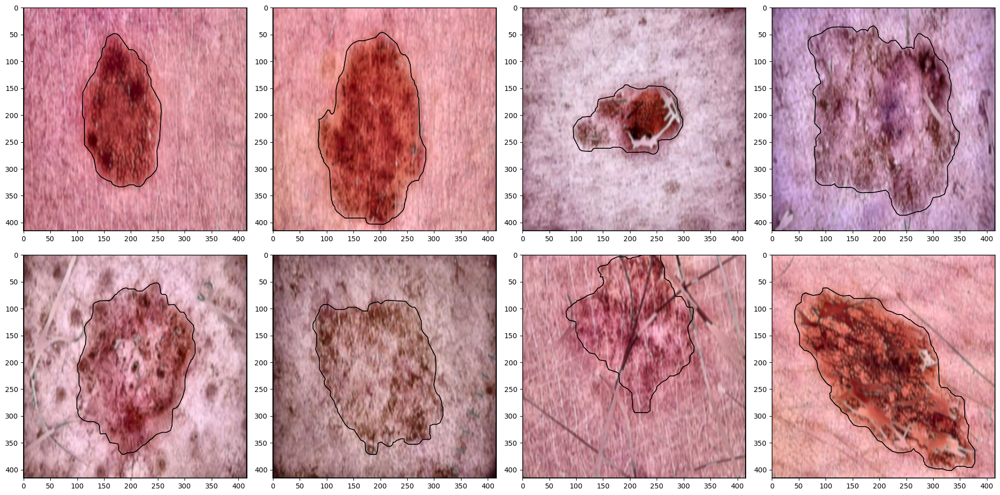

In [48]:
def display_images_with_coco_annotations(image_paths, annotations, display_type='both', colors=None):
    # Create a 2x4 grid of subplots for displaying images
    fig, axs = plt.subplots(2, 4, figsize=(20, 10))
    
    for ax_row, row_images in zip(axs, image_paths):
       
        for ax, img_path in zip(ax_row, row_images):
           
            image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
            ax.imshow(image)
            ax.axis('on')

            # Find the image ID for the current image path
            img_filename = os.path.basename(img_path)
            img_id = next(item['id'] for item in annotations['images'] if item["file_name"] == img_filename)
            
            # Get the annotations for the current image ID
            img_annotations = [ann for ann in annotations['annotations'] if ann['image_id'] == img_id]
            
            # Iterate over each annotation and display bounding boxes or segmentations
            for ann in img_annotations:
                if display_type in ['bbox', 'both']:
                    bbox = ann['bbox']
                    ax.add_patch(patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='black', facecolor='none'))
                
                if display_type in ['seg', 'both']:
                    for seg in ann['segmentation']:
                        poly = [(seg[i], seg[i+1]) for i in range(0, len(seg), 2)]
                        ax.add_patch(patches.Polygon(poly, closed=True, edgecolor='black', fill=False))
                        
    plt.tight_layout()
    plt.show()

# Load annotations from the JSON file
with open('Dataset/Output/CocoJsonMask/resize_image.json', 'r') as f:
    annotations = json.load(f)

# Select 8 random image files
image_dir = "Dataset/Output/Processed/finalProcessed"
image_files = random.sample([os.path.join(image_dir, img['file_name']) for img in annotations['images']], 8)

# Reshape the list of image files into a 2x4 grid
image_files = [image_files[i:i+4] for i in range(0, len(image_files), 4)]

# Display images with COCO annotations
display_images_with_coco_annotations(image_files, annotations, 'seg')


# Yolov5 Model


In [49]:
%pip install torch torchvision

Note: you may need to restart the kernel to use updated packages.


In [81]:
def coco_to_yolo(coco_annotation_path, output_dir):
    with open(coco_annotation_path, 'r') as f:
        coco_annotations = json.load(f)

    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    for image_info in coco_annotations['images']:
        img_id = image_info['id']
        img_name = image_info['file_name']
        img_annotations = [ann for ann in coco_annotations['annotations'] if ann['image_id'] == img_id]

        yolo_annotations = []
        for ann in img_annotations:
            bbox = ann['bbox']
            x_center = bbox[0] + bbox[2] / 2
            y_center = bbox[1] + bbox[3] / 2
            width = bbox[2]
            height = bbox[3]

            yolo_annotations.append(f"{ann['category_id']} {x_center} {y_center} {width} {height}")

        with open(os.path.join(output_dir, os.path.splitext(img_name)[0] + '.txt'), 'w') as f:
            f.write('\n'.join(yolo_annotations))

coco_annotation_path = 'Dataset/Output/CocoJsonMask/resize_image.json'
output_dir = 'Dataset/Output/Data'
coco_to_yolo(coco_annotation_path, output_dir)

In [80]:

source_dir = 'Dataset/Output/Processed/finalProcessed'
dest_dir = 'Dataset/Output/Data'

# Create the destination directory if it doesn't exist
os.makedirs(dest_dir, exist_ok=True)

# Copy all files from source_dir to dest_dir
for file_name in os.listdir(source_dir):
    source_file = os.path.join(source_dir, file_name)
    dest_file = os.path.join(dest_dir, file_name)
    shutil.copyfile(source_file, dest_file)

print("Files copied successfully.")



Files copied successfully.


In [85]:
from random import choice

#arrays to store file names
imgs =[]
xmls =[]

#setup dir names
trainPath = 'Dataset/Output/newDataset/images/train'
valPath = 'Dataset/Output/newDataset/images/val'
crsPath = 'Dataset/Output/Data' #dir where images and annotations stored

#setup ratio (val ratio = rest of the files in origin dir after splitting into train and test)
train_ratio = 0.8
val_ratio = 0.2


#total count of imgs
totalImgCount = len(os.listdir(crsPath))/2

#soring files to corresponding arrays
for (dirname, dirs, files) in os.walk(crsPath):
    for filename in files:
        if filename.endswith('.txt'):
            xmls.append(filename)
        else:
            imgs.append(filename)


#counting range for cycles
countForTrain = int(len(imgs)*train_ratio)
countForVal = int(len(imgs)*val_ratio)
print("training images are : ",countForTrain)
print("Validation images are : ",countForVal)

training images are :  40
Validation images are :  10


In [86]:
trainimagePath = 'Dataset/Output/newDataset/images/train'
trainlabelPath = 'Dataset/Output/newDataset/labels/train'
valimagePath = 'Dataset/Output/newDataset/images/val'
vallabelPath = 'Dataset/Output/newDataset/labels/val'
os.makedirs(trainimagePath, exist_ok=True)
os.makedirs(trainlabelPath, exist_ok=True)
os.makedirs(valimagePath, exist_ok=True)
os.makedirs(vallabelPath, exist_ok=True)
#cycle for train dir
for x in range(countForTrain):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-4] +'.txt' # get name of corresponding annotation file

    #move both files into train dir
    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))
    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))


    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)



#cycle for test dir   
for x in range(countForVal):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-4] +'.txt' # get name of corresponding annotation file

    #move both files into train dir
    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(valimagePath, fileJpg))
    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(vallabelPath, fileXml))
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(valimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(vallabelPath, fileXml))
    
    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)

# #rest of files will be validation files, so rename origin dir to val dir
# os.rename(crsPath, valPath)
# shutil.move(crsPath, valPath)

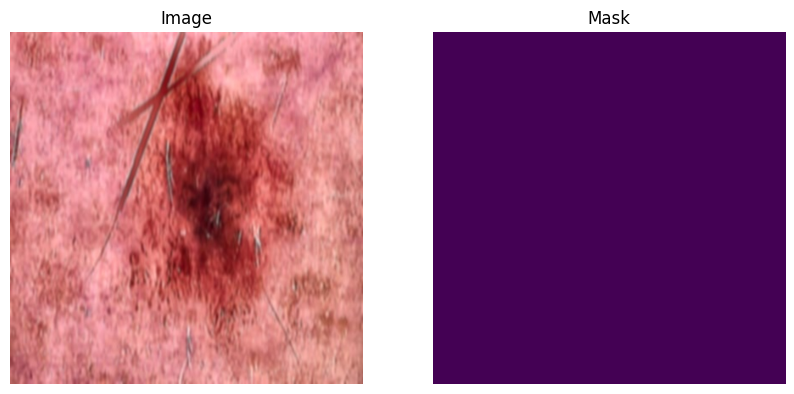

In [174]:
import glob
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Path to your dataset
image_train_dir = 'Dataset/Output/newDataset/images/train'
image_val_dir = 'Dataset/Output/newDataset/images/val'
label_train_dir = 'Dataset/Output/newDataset/labels/train'
label_val_dir = 'Dataset/Output/newDataset/labels/val'

def read_yolo_mask(file_path):
    with open(file_path, 'r') as file:
        lines = file.readlines()
    mask = np.zeros((416, 416), dtype=np.uint8)
    for line in lines:
        parts = line.split()
        class_id = int(parts[0])
        x_center = float(parts[1])
        y_center = float(parts[2])
        width = float(parts[3])
        height = float(parts[4])
        x1 = int((x_center - width/2) * 416)
        y1 = int((y_center - height/2) * 416)
        x2 = int((x_center + width/2) * 416)
        y2 = int((y_center + height/2) * 416)
        mask[y1:y2, x1:x2] = class_id
    return mask

# Example code to read an image and its mask and display them
def plot_image_with_mask(image_path, mask_path):
    image = cv2.imread(image_path)
    mask = read_yolo_mask(mask_path)
    
    # Plotting the image
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Image')
    plt.axis('off')

    # Plotting the mask
    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='viridis', vmin=0, vmax=1)
    plt.title('Mask')
    plt.axis('off')

    plt.show()

# Get paths to all image and mask files
image_train_files = sorted(glob.glob(os.path.join(image_train_dir, '*.jpg')))
label_train_files = sorted(glob.glob(os.path.join(label_train_dir, '*.txt')))
image_val_files = sorted(glob.glob(os.path.join(image_val_dir, '*.jpg')))
label_val_files = sorted(glob.glob(os.path.join(label_val_dir, '*.txt')))

# Display one example image and mask
plot_image_with_mask(image_train_files[0], label_train_files[0])


In [153]:
import os
import yaml

yaml_path = 'Dataset/Output/newDataset/dataset.yaml'

# Check if the dataset.yaml file already exists
if not os.path.exists(yaml_path):
    data = {
        'train': '../Dataset/Output/newDataset/images/train',
        'val': '../Dataset/Output/newDataset/images/val',
        'nc': 1,
        "names":  '["affected"]' 
    }#suv: please update the file and remove the '' the real structure will be names: ["affected"] 

    with open(yaml_path, 'w') as file:
        yaml.dump(data, file, default_flow_style=False)
        print(f"Created dataset.yaml file at {yaml_path}")
else:
    print(f"dataset.yaml file already exists at {yaml_path}")



dataset.yaml file already exists at Dataset/Output/newDataset/dataset.yaml


In [92]:
# clone project repository and install dependencies
!git clone https://github.com/ultralytics/yolov5.git 


Cloning into 'yolov5'...


In [154]:
%cd yolov5
%pip install -r requirements.txt # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5  v7.0-286-g41603da1 Python-3.12.2 torch-2.2.0+cpu CPU


Setup complete  (12 CPUs, 7.4 GB RAM, 133.0/214.8 GB disk)


In [165]:
print(os.getcwd())


d:\FinalYearProj_KMRT1S2\yolov5
d:\FinalYearProj_KMRT1S2


In [173]:
import torch
import torch.nn as nn
import glob
from PIL import Image
import os

class YOLOv5Segmentation(nn.Module):
    def __init__(self, num_classes=1):
        super(YOLOv5Segmentation, self).__init__()
        self.num_classes = num_classes
        self.conv = nn.Conv2d(1024, num_classes, kernel_size=1, stride=1, padding=0)

    def forward(self, x):
        x = self.conv(x)
        return x

# Example custom dataset class for semantic segmentation
class CustomSegmentationDataset(torch.utils.data.Dataset):
    def __init__(self, image_dir, label_dir):
        self.images = glob.glob(os.path.join(image_dir, '*.jpg'))
        self.labels = glob.glob(os.path.join(label_dir, '*.png'))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = Image.open(self.images[idx % len(self.images)])
        label = Image.open(self.labels[idx % len(self.labels)])
        image = image.resize((416, 416))  # Resize image to 416x416
        label = label.resize((416, 416))  # Resize label to 416x416
        image = torch.tensor(image, dtype=torch.float32).permute(2, 0, 1)  # Convert image to tensor and change shape to CxHxW
        label = torch.tensor(label, dtype=torch.long)  # Assuming label is a single-channel image
        return image, label

# Example usage
train_dataset = CustomSegmentationDataset(image_dir='Dataset/Output/newDataset/images/train', label_dir='Dataset/Output/newDataset/labels/train')
val_dataset = CustomSegmentationDataset(image_dir='Dataset/Output/newDataset/images/train', label_dir='Dataset/Output/newDataset/labels/val')

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=16, shuffle=False)

model = YOLOv5Segmentation(num_classes=1)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
num_epochs = 10  

# Training loop
for epoch in range(num_epochs):
    for images, labels in train_loader:
        optimizer.zero_grad()


ZeroDivisionError: integer modulo by zero

In [162]:
!python train.py --img 416 --batch 16 --epochs 10 --data ../Dataset/Output/newDataset/dataset.yaml --weights yolov5/weights/yolov5s.pt --cache
if cache:
    labels, shapes, self.segments = zip(*cache.values())
else:
    labels, shapes, self.segments = [], [], []  # Set default values



train: weights=yolov5/weights/yolov5s.pt, cfg=, data=../Dataset/Output/newDataset/dataset.yaml, hyp=data\hyps\hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data\hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs\train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 
YOLOv5  v7.0-286-g41603da1 Python-3.12.2 torch-2.2.0+cpu CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, c

NameError: name 'cache' is not defined

In [117]:
HOME = os.getcwd()
print(HOME)


d:\FinalYearProj_KMRT1S2\yolov5


In [51]:
# clone project repository and install dependencies
!git clone https://github.com/ultralytics/yolov5.git 


fatal: destination path 'yolov5' already exists and is not an empty directory.


In [52]:
%cd yolov5
%pip install -r requirements.txt # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5  v7.0-286-g41603da1 Python-3.12.2 torch-2.2.0+cpu CPU


Setup complete  (12 CPUs, 7.4 GB RAM, 132.9/214.8 GB disk)


In [53]:
# download pretrained weights

from utils.downloads import attempt_download

p5 = ['n', 's', 'm', 'l', 'x']  # P5 models
cls = [f'{x}-seg' for x in p5]  # segmentation models

for x in cls:
    attempt_download(f'{HOME}/yolov5/weights/yolov5{x}.pt')

d:\FinalYearProj_KMRT1S2\yolov5


segment\predict: weights=['weights/yolov5s-seg.pt'], source=data/images/bus.jpg, data=data\coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs\predict-seg, name=test-inference, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1, retina_masks=False
YOLOv5  v7.0-286-g41603da1 Python-3.12.2 torch-2.2.0+cpu CPU

Fusing layers... 
YOLOv5s-seg summary: 224 layers, 7611485 parameters, 0 gradients, 26.4 GFLOPs
image 1/1 D:\FinalYearProj_KMRT1S2\yolov5\data\images\bus.jpg: 640x480 4 persons, 1 bus, 251.0ms
Speed: 0.0ms pre-process, 251.0ms inference, 0.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs\predict-seg\test-inference4


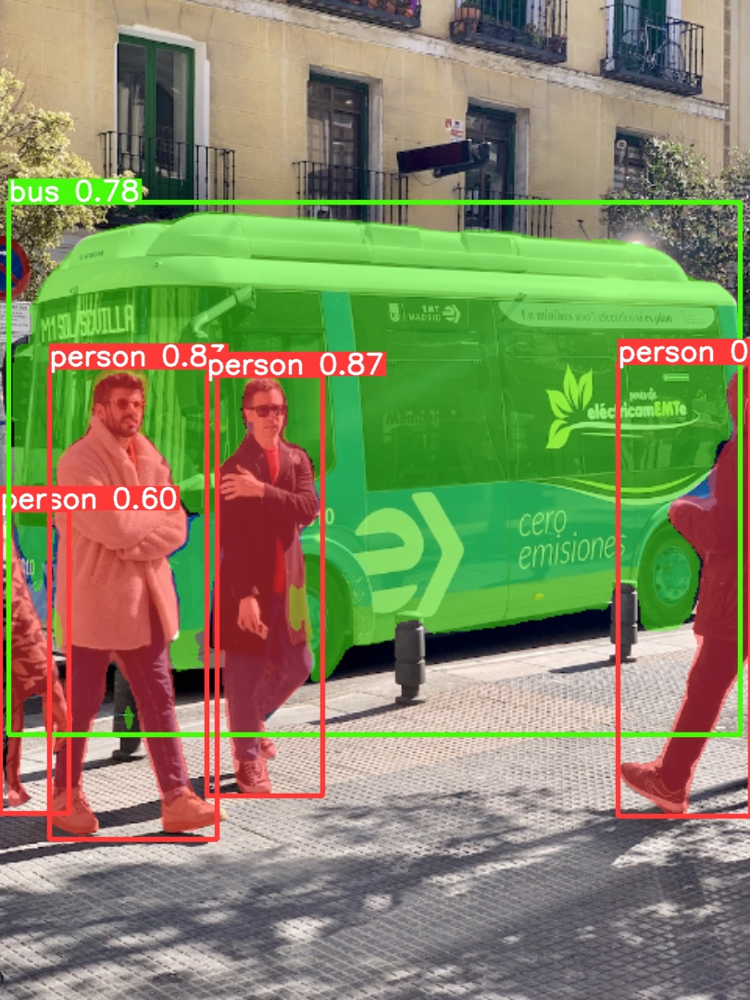

In [54]:
# infer using segment/predict.py

%cd {HOME}/yolov5
!python segment/predict.py --weights weights/yolov5s-seg.pt --source data/images/bus.jpg --name test-inference
display.Image(filename=f"{HOME}/yolov5/runs/predict-seg/test-inference/bus.jpg", width=600)

In [55]:
#Download example image
import requests
image_url = "https://i.imgur.com/EbOBS5l.jpg"
response = requests.get(image_url)
response.raise_for_status()
with open(f"{HOME}/yolov5/data/images/zebra.jpg", "wb") as handler:
    handler.write(response.content)

d:\FinalYearProj_KMRT1S2\yolov5


segment\predict: weights=['weights/yolov5s-seg.pt'], source=data/images/zebra.jpg, data=data\coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs\predict-seg, name=coco, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1, retina_masks=False
YOLOv5  v7.0-286-g41603da1 Python-3.12.2 torch-2.2.0+cpu CPU

Fusing layers... 
YOLOv5s-seg summary: 224 layers, 7611485 parameters, 0 gradients, 26.4 GFLOPs
image 1/1 D:\FinalYearProj_KMRT1S2\yolov5\data\images\zebra.jpg: 448x640 1 zebra, 190.4ms
Speed: 4.0ms pre-process, 190.4ms inference, 11.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs\predict-seg\coco


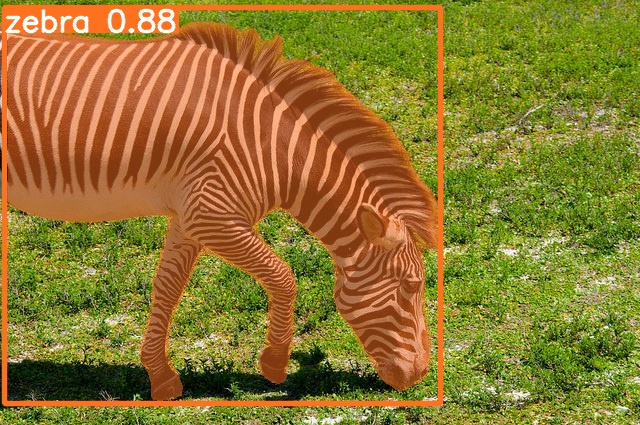

In [56]:
#Infer using segment/predict.py
%cd {HOME}/yolov5 
!python segment/predict.py --weights weights/yolov5s-seg.pt --source data/images/zebra.jpg --name coco
display.Image(filename=f"{HOME}/yolov5/runs/predict-seg/coco/zebra.jpg", width=600)

In [68]:
import os
import torch
from zipfile import ZipFile

HOME = os.path.expanduser("~")

# Download file
torch.hub.download_url_to_file("https://ultralytics.com/assets/coco128-seg.zip", f"{HOME}/tmp.zip")

# Unzip file
with ZipFile(f"{HOME}/tmp.zip", "r") as zip_ref:
    zip_ref.extractall(f"{HOME}/yolov5/datasets")

# Remove zip file
os.remove(f"{HOME}/tmp.zip")


100%|██████████| 6.79M/6.79M [00:00<00:00, 11.6MB/s]


In [81]:
%cd {HOME}/yolov5
!python segment/val.py --weights yolov5s-seg.pt --data coco128-seg.yaml --img 640 --name coco


C:\Users\SUVROJIT\yolov5


C:\Users\SUVROJIT\AppData\Local\Programs\Python\Python312\python.exe: can't open file 'C:\\Users\\SUVROJIT\\yolov5\\segment\\val.py': [Errno 2] No such file or directory
